# Test on 3 Lamb-Oseen flows and 3 Sin flows
- Author: Yong Lee (yongli.cv@gmail.com)
- Date: Aug 1st, 2021

```python
# The particle images are simulated by executing the following python codes
cd ./PIG
python PIG.py
```

In [1]:
from deformpiv import *
import os

kernel_methods = ['openpiv', 'opticalflow', 'deeppiv']
warping_methods = ['FDI', 'CDI', 'CDDI', 'FDDI']

test_set = ['./PIG/oseen_1000.0.npz', './PIG/oseen_2000.0.npz', './PIG/oseen_3000.0.npz',
           './PIG/sin_2.5.npz', './PIG/sin_5.0.npz', './PIG/sin_7.5.npz']

results = []
for k, case in enumerate(test_set):
    print(f"\nComputing for case: {case}")
    data = np.load(case)

    img1 = data['img1']
    img2 = data['img2']
    ut, vt = data['u'], data['v']

    
    def biaserror(x, y, u, v):
        if ut.shape != u.shape:
            temp_ut = remap(ut, x, y)
            temp_vt = remap(vt, x, y)
        else:
            temp_ut, temp_vt = ut.copy(), vt.copy()
        err = np.sqrt((u-temp_ut)**2+(v-temp_vt)**2)

        # don't evaluate the error within the image boundary
        err[:3,:], err[-3:,:], err[:,:3], err[:,-3:] = np.nan, np.nan, np.nan, np.nan
        if err.shape[0]>100:
            err[0:30,:], err[-30:,:], err[:,:30], err[:,-30:] = np.nan, np.nan, np.nan, np.nan
        return err

    
    result = []
    for kernel in kernel_methods:
        result.append([])
        for warp in warping_methods:
            config = AttrDict()
            config.pivmethod = kernel
            config.deform = warp
            config.runs = 10

            piv = DeformPIV(config)
            x, y, u, v = piv.compute(img1, img2)
            err = biaserror(x, y, u, v)
            result[-1].append([x, y, u, v, err.copy()])
    results.append(result)

Cuda installed! Running on GPU!
unliteflownet load successfully.

Computing for case: ./PIG/oseen_1000.0.npz

Computing for case: ./PIG/oseen_2000.0.npz

Computing for case: ./PIG/oseen_3000.0.npz

Computing for case: ./PIG/sin_2.5.npz

Computing for case: ./PIG/sin_5.0.npz

Computing for case: ./PIG/sin_7.5.npz


./PIG/oseen_1000.0.npz
openpiv      _FDI  _AE0.045_RMSE0.053
openpiv      _CDI  _AE0.028_RMSE0.037
openpiv      _CDDI _AE0.028_RMSE0.037
openpiv      _FDDI _AE0.026_RMSE0.035
opticalflow  _FDI  _AE0.044_RMSE0.048
opticalflow  _CDI  _AE0.053_RMSE0.058
opticalflow  _CDDI _AE0.053_RMSE0.057
opticalflow  _FDDI _AE0.024_RMSE0.026
deeppiv      _FDI  _AE0.056_RMSE0.064
deeppiv      _CDI  _AE0.058_RMSE0.064
deeppiv      _CDDI _AE0.058_RMSE0.064
deeppiv      _FDDI _AE0.042_RMSE0.048
./PIG/oseen_2000.0.npz
openpiv      _FDI  _AE0.143_RMSE0.166
openpiv      _CDI  _AE0.041_RMSE0.058
openpiv      _CDDI _AE0.040_RMSE0.057
openpiv      _FDDI _AE0.039_RMSE0.057
opticalflow  _FDI  _AE0.137_RMSE0.169
opticalflow  _CDI  _AE0.045_RMSE0.050
opticalflow  _CDDI _AE0.045_RMSE0.049
opticalflow  _FDDI _AE0.017_RMSE0.020
deeppiv      _FDI  _AE0.143_RMSE0.173
deeppiv      _CDI  _AE0.059_RMSE0.066
deeppiv      _CDDI _AE0.059_RMSE0.065


/home/yong/miniconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


deeppiv      _FDDI _AE0.041_RMSE0.047
./PIG/oseen_3000.0.npz
openpiv      _FDI  _AE0.316_RMSE0.368
openpiv      _CDI  _AE0.052_RMSE0.076
openpiv      _CDDI _AE0.050_RMSE0.074
openpiv      _FDDI _AE0.050_RMSE0.073
opticalflow  _FDI  _AE0.308_RMSE0.378
opticalflow  _CDI  _AE0.033_RMSE0.038
opticalflow  _CDDI _AE0.032_RMSE0.037
opticalflow  _FDDI _AE0.018_RMSE0.022
deeppiv      _FDI  _AE0.433_RMSE1.031
deeppiv      _CDI  _AE0.119_RMSE0.592
deeppiv      _CDDI _AE0.116_RMSE0.583
deeppiv      _FDDI _AE0.175_RMSE0.958
./PIG/sin_2.5.npz
openpiv      _FDI  _AE0.036_RMSE0.041
openpiv      _CDI  _AE0.031_RMSE0.034
openpiv      _CDDI _AE0.032_RMSE0.034
openpiv      _FDDI _AE0.024_RMSE0.027
opticalflow  _FDI  _AE0.034_RMSE0.037
opticalflow  _CDI  _AE0.076_RMSE0.076
opticalflow  _CDDI _AE0.076_RMSE0.077
opticalflow  _FDDI _AE0.021_RMSE0.024
deeppiv      _FDI  _AE0.052_RMSE0.058
deeppiv      _CDI  _AE0.089_RMSE0.093
deeppiv      _CDDI _AE0.089_RMSE0.093
deeppiv      _FDDI _AE0.043_RMSE0.049
./PIG/sin

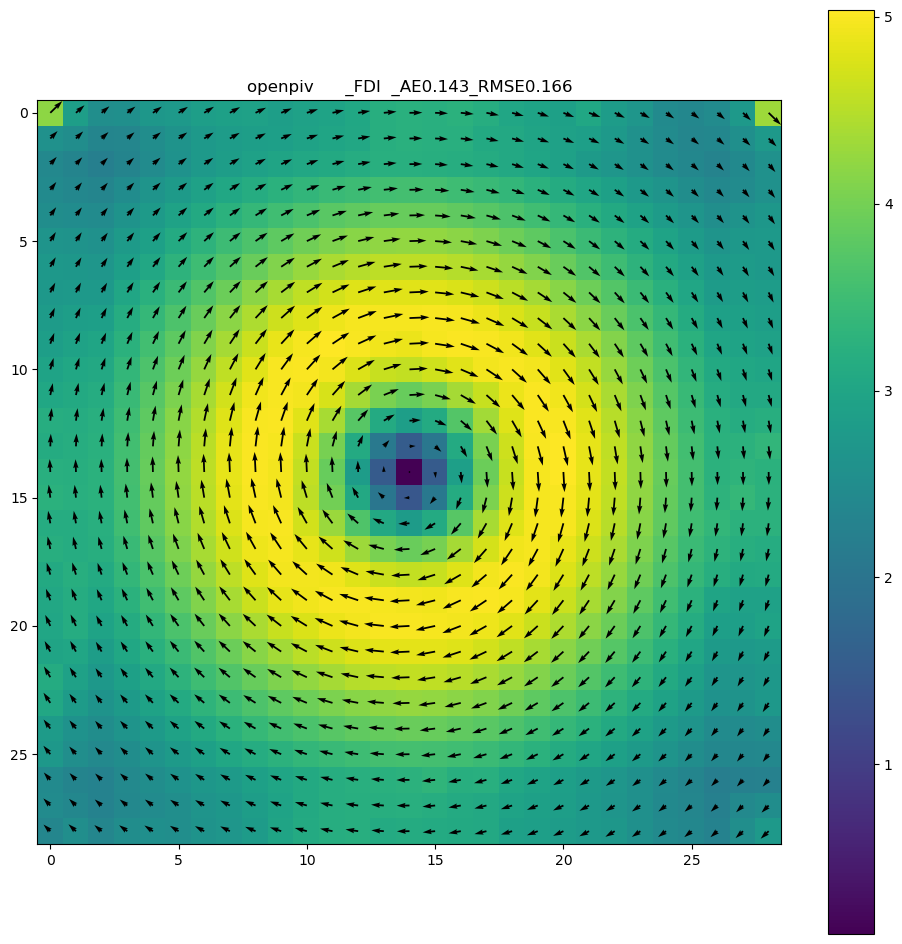

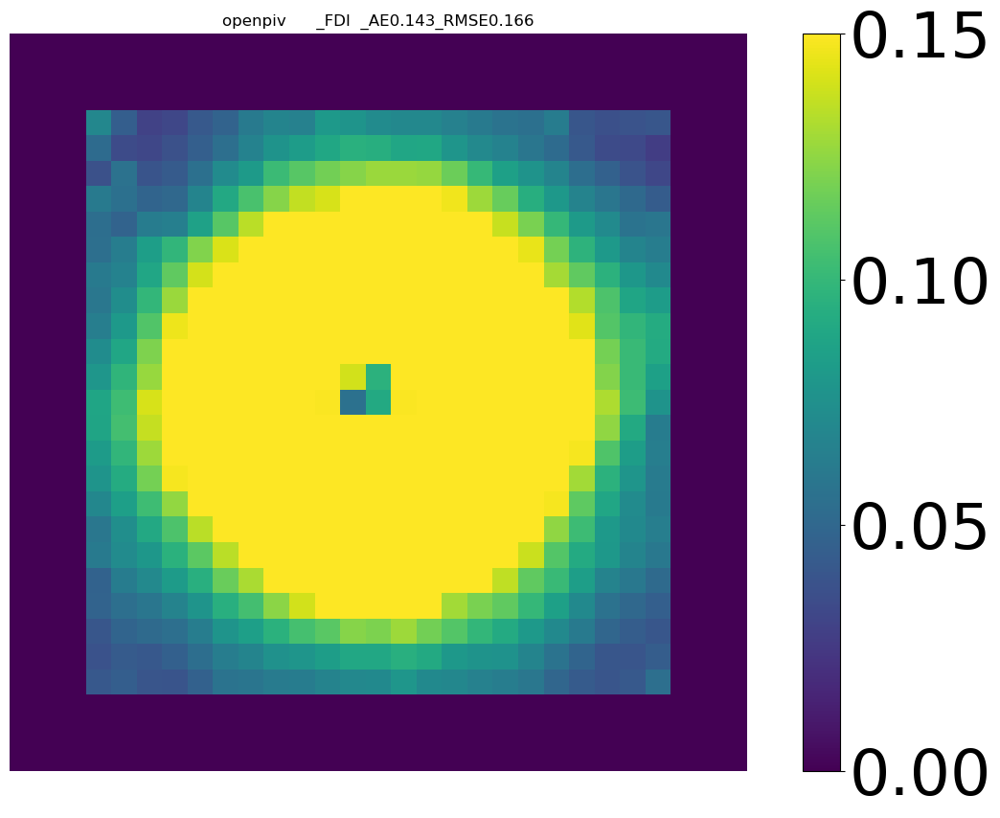

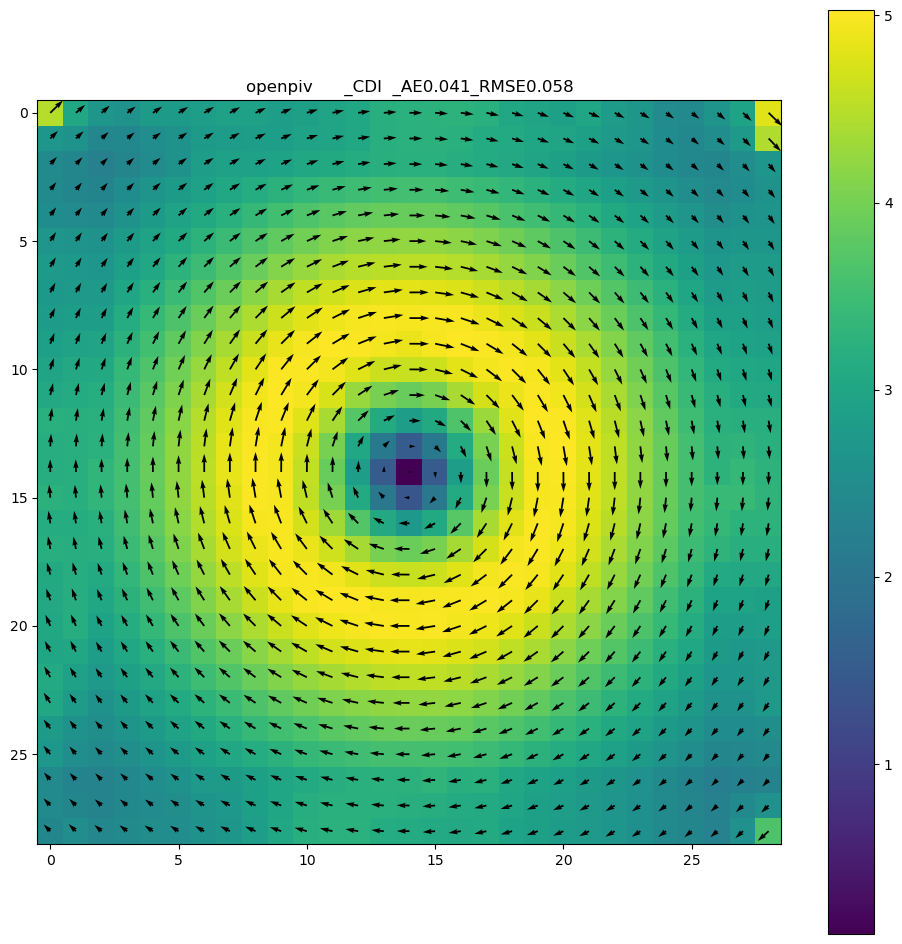

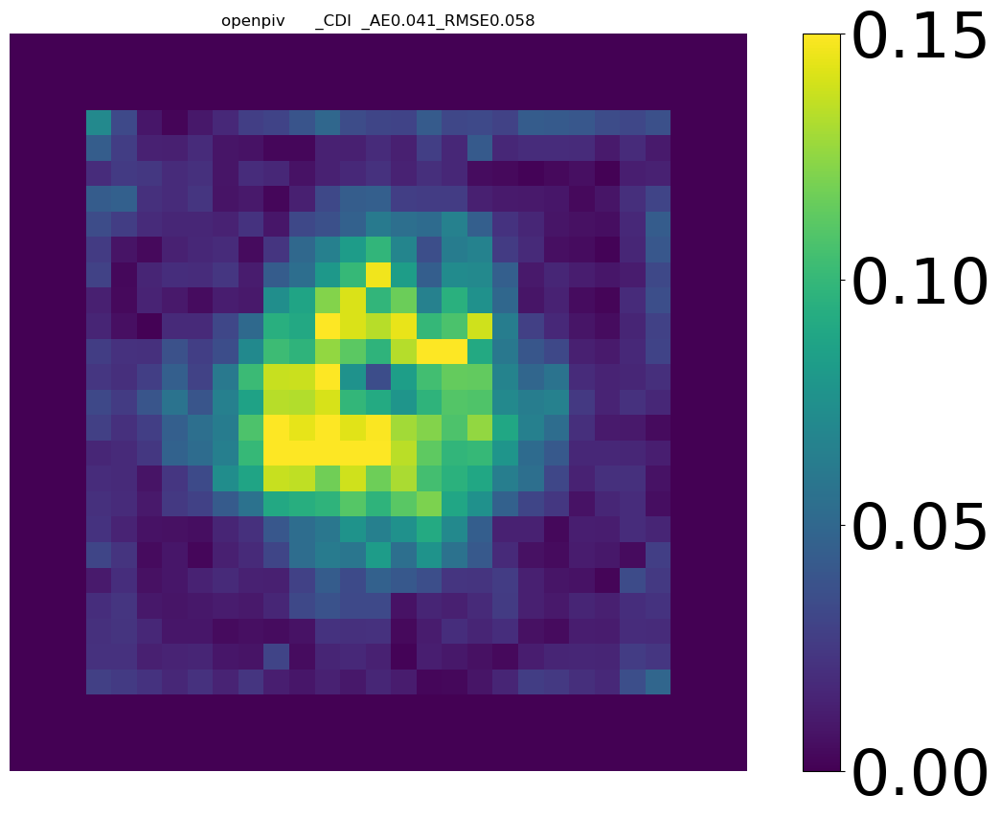

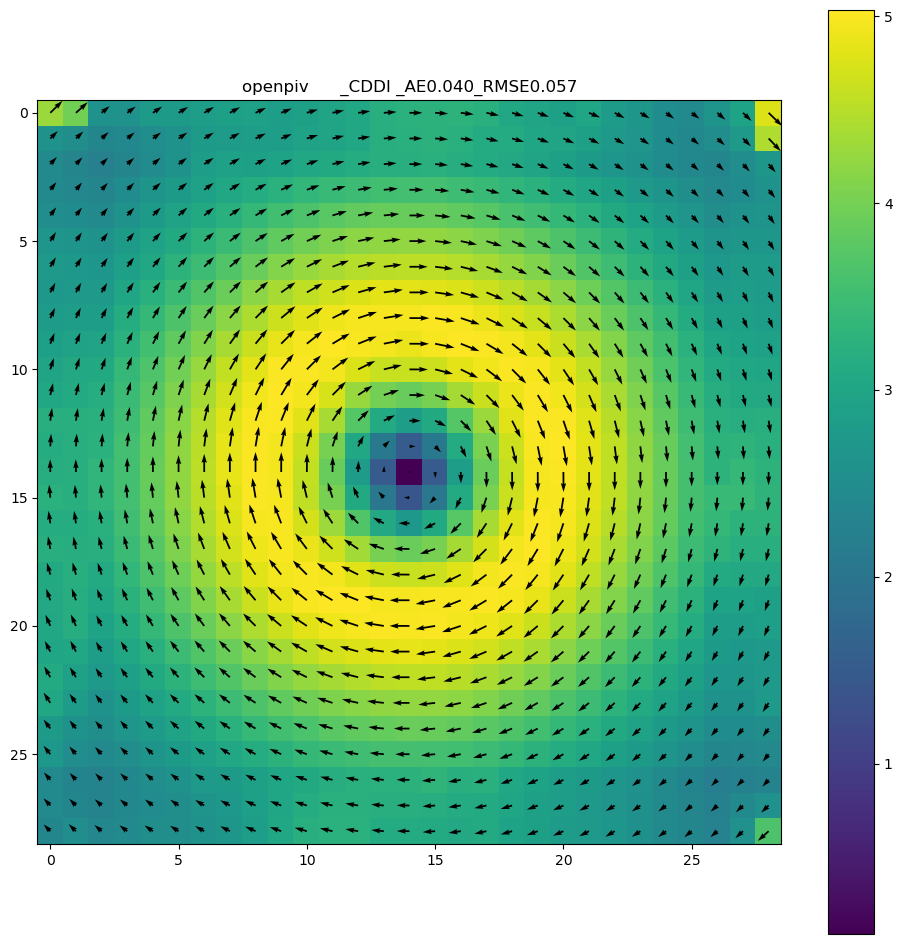

...

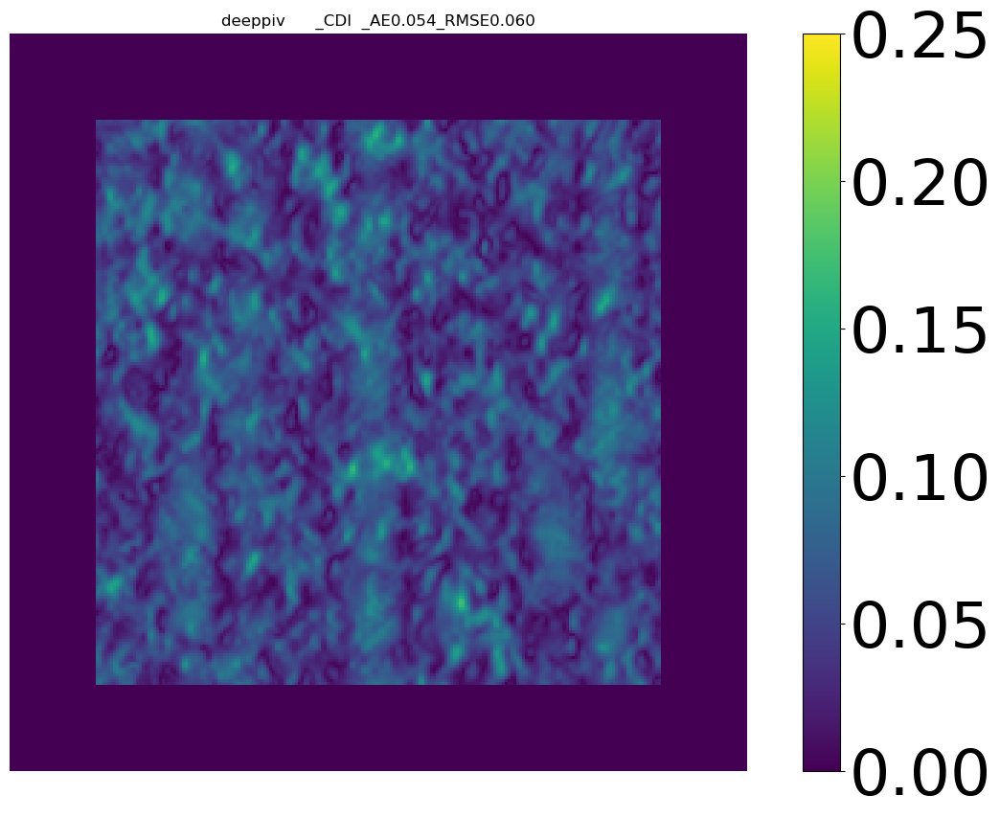

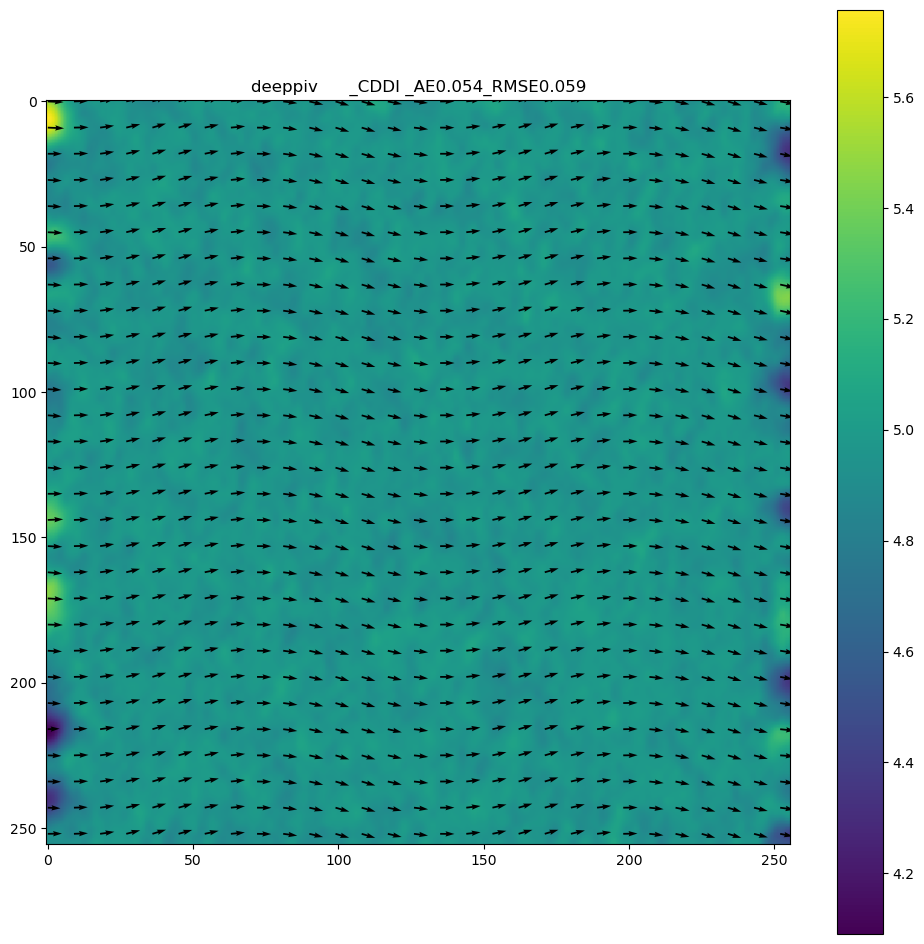

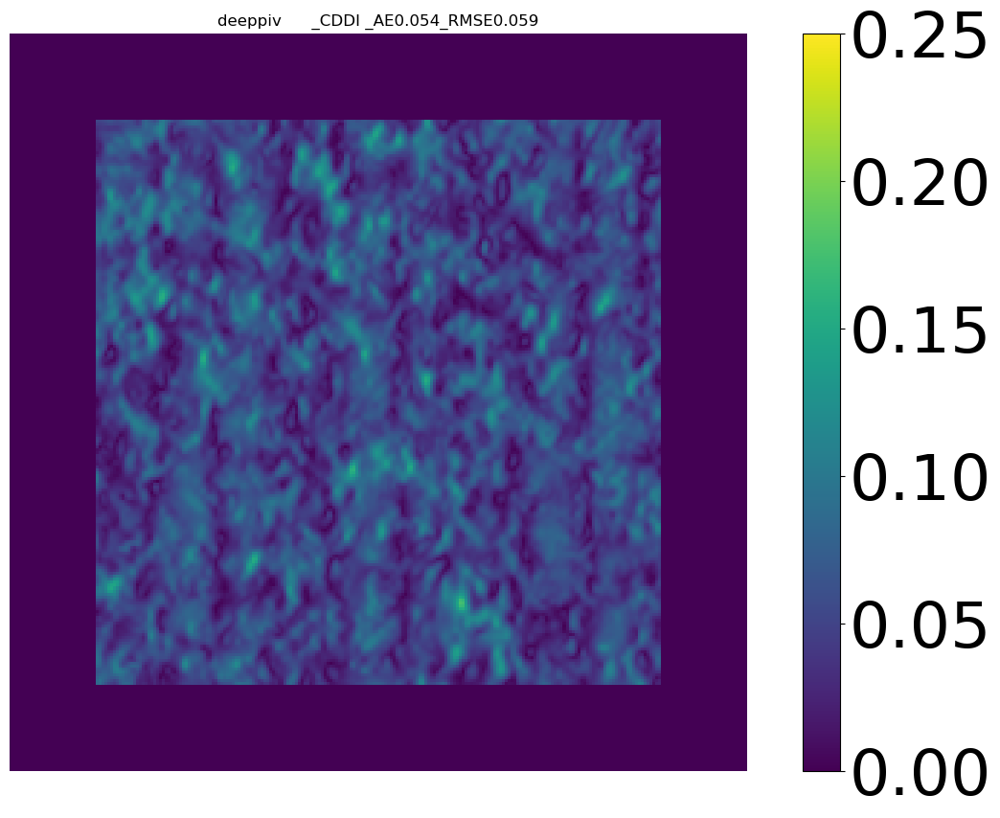

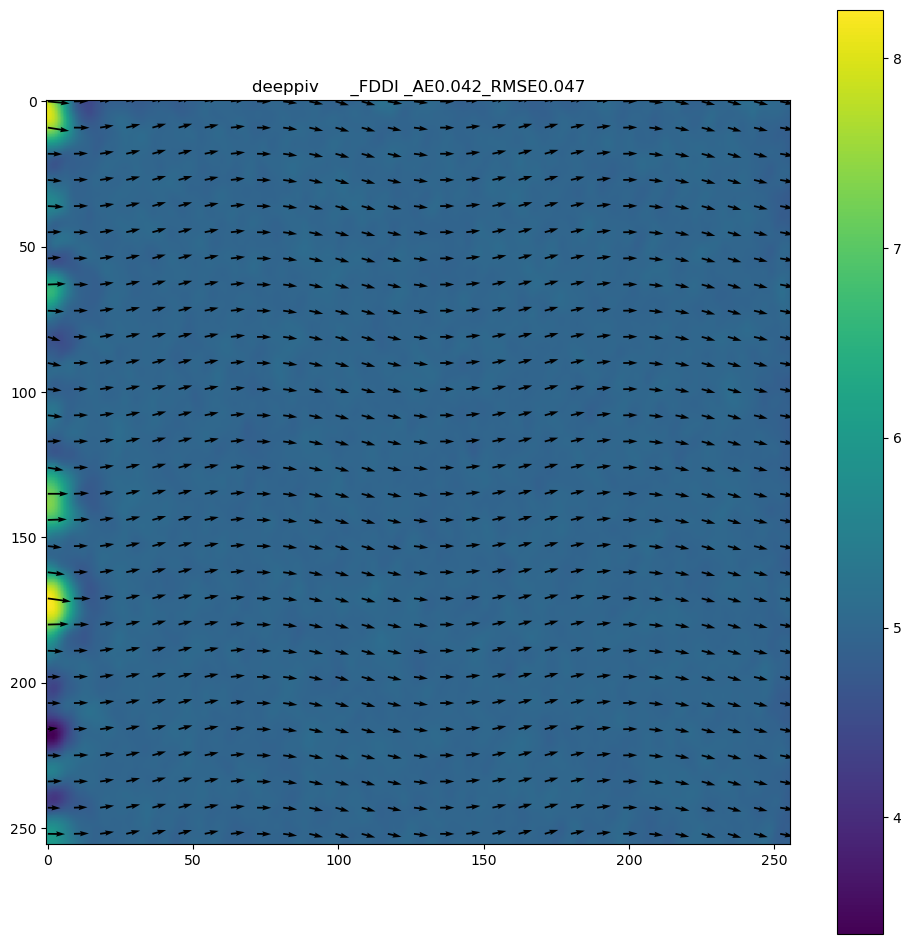

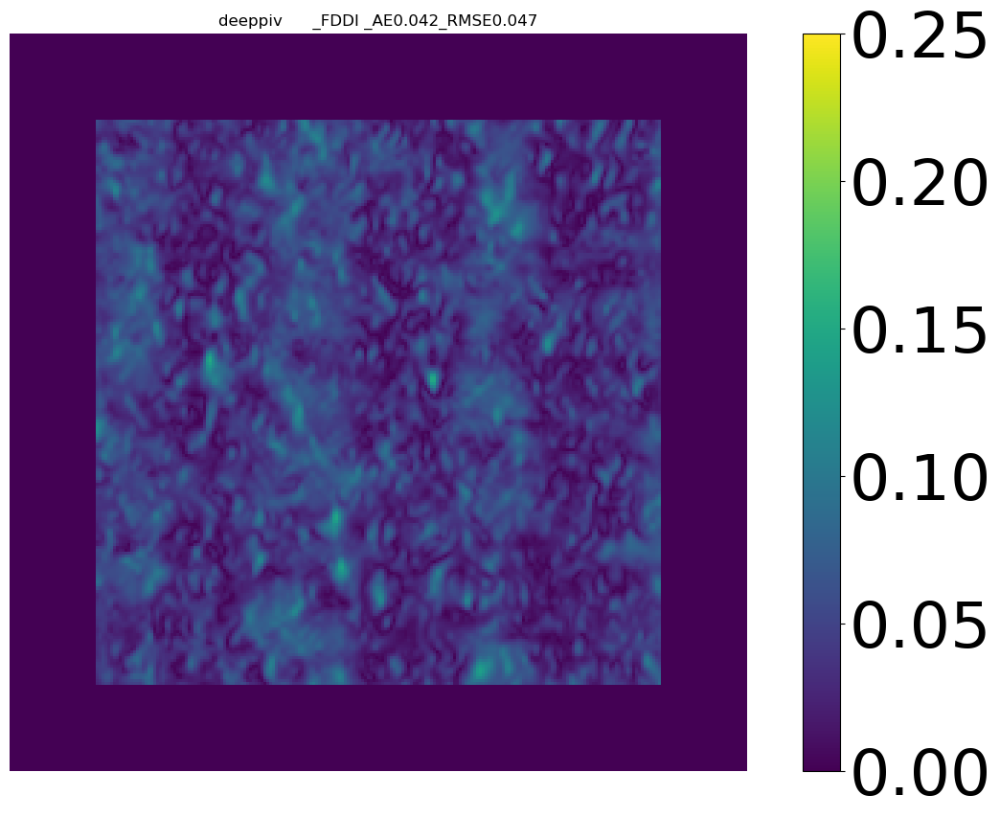

In [2]:
# visualize the results 
for k, case in enumerate(test_set):
    print(case)
    result = results[k]
    # plot the results
    for i, kernel in enumerate(kernel_methods):
        for j, warp in enumerate(warping_methods):
            x, y, u, v, err = result[i][j]
            x_delta, y_delta = x[0,1]-x[0,0], y[1,0]-x[0,0]
            mean_err = np.nanmean(err)
            rmse_err = np.sqrt(np.nanmean(err*err))
            info =f"{kernel:13s}_{warp:5s}_AE{mean_err:.3f}_RMSE{rmse_err:.3f}"
            print(info)

            if k==1 or k == 4: # Lamb-Oseen 2000, Sine-flow 5.0;
                step0, step1 = int(u.shape[0]/32+1), int(u.shape[1]/32+1)
                fig = plt.figure(figsize=(12,12))
                plt.imshow(np.sqrt(u*u+v*v))
                plt.colorbar()
                plt.quiver((x[::step0, ::step1]-x[0,0])/x_delta, (y[::step0, ::step1]-y[0,0])/y_delta, u[::step0, ::step1], -v[::step0, ::step1])
                plt.title(info)

                fig = plt.figure(figsize=(15,10))
                vmax = 0.15 if k==1 else 0.25
                errx = err.copy()
                errx[np.isnan(errx)]=0.0
                plt.imshow(errx, vmax=vmax)

                cb = plt.colorbar()
                cb.ax.tick_params(labelsize=48)  #设置色标刻度字体大小。
                plt.axis('off')
                plt.savefig(f"./output/{k}"+info+'.pdf') 
#                 os.system(f"pdfcrop './output/{k}{info}.pdf' './output/{k}{info}.pdf'")
                plt.title(info)

plt.show()